# Uke 4: Kart og mer

I denne siste notatboken skal vi utforske hvordan man lager kartvisualiseringer ved hjelp av Vega-Altair og se nærmere på hvordan man tilpasser et visualiseringsdashbord på et globalt nivå. Vi introduserte først [Altair](https://altair-viz.github.io/) i [DIGI118 Modul 1: Heisann, Altair!](https://www.kaggle.com/code/lauragarrison/digi118-modul-1-heisann-altair), introduserte metoder for å tilpasse visualiseringer i [DIGI118 Modul 2: Det riktige diagrammet for jobben](https://www.kaggle.com/code/amykzhang/digi118-modul-2-det-riktige-diagrammet-for-jobben), og la til interaktivitet i kartet vårt i [DIGI118 Modul 3: Gjør det interaktivt](https://www.kaggle.com/code/amykzhang/digi118-modul-3-gj-r-det-interaktivt).

Kart gir mye kontekst til dataene våre. Altair kan arbeide med mange forskjellige geografiske dataformater, for eksempel shapefiler, geojson-filer og topojson-filer. I denne modulen vil du lære om Altairs kartvisualiseringsfunksjoner ved hjelp av Titanic-datasettet. Deretter vil du bruke disse konseptene til å lage en kartvisualisering og kombinere den med de to diagrammene du har laget så langt, for å lage et endelig visualiseringsinstrumentbord.
- Lese inn kartdata ved hjelp av `geopandas`-biblioteket
- Bruke `geoshape`-merket
- Kartprojeksjoner
- Bygge opp et kart i lag: Polygoner, linjer og punkter
- Fokusere på bestemte regioner med vår hjelpefunksjon `zoomify()`.
- Valgfritt: Tegning "as the crow flies" med vår hjelpefunksjon `rideify()`.
- Et nytt besøk: Globale konfigurasjoner (se tilpasningsnivåer i [Modul 2](https://www.kaggle.com/code/amykzhang/digi118-modul-2-det-riktige-diagrammet-for-jobben))

**La oss komme i gang!**

---

### Lag først en kopi av denne notatboken ved hjelp av knappen øverst til høyre i dette vinduet.
Nå er du klar til å kode i din egen versjon av denne notatboken.

# 1. Importer og les data: kartutgave
Som vanlig må vi først importere bibliotekene `pandas` og `altair`. Vi leser også inn vårt [Titantic datasett](https://www.kaggle.com/datasets/amykzhang/titanic-dataset-with-coordinates) på vanlig måte.

In [8]:
import pandas as pd
import altair as alt

titanic = pd.read_csv("titanic_coord.csv")

For å plotte geografiske grenser, som bydeler og land, må vi lese inn geografiske formdata som skal vises i Altair. 

Geospatiale data krever imidlertid en litt spesiell behandling. I stedet for å bruke `pandas`, bruker vi [`geopandas`-biblioteket](https://geopandas.org/en/stable/) til å lese inn data. Dette biblioteket utvider mulighetene til pandas og gjør det enklere å jobbe med geospatiale data i python.

In [9]:
import geopandas

Ved hjelp av `geopandas` kan vi lese inn vanlige filtyper for geodata og konvertere dem til en `GeoDataFrame` som Altair kan visualisere. Eksempler på geodatafiltyper er shapefiler, geojson-filer og topojson-filer.

Vi kan bruke `read_file()` fra `geopandas`-biblioteket for å lese inn filer. Denne metoden tar inn stien eller url-en til den geospatiale filen samt filtypen. 

Her leser vi inn datasettet *Natural Earth 110m Cultural Vectors*, som er en zippet shapefil som inneholder data fra et verdenskart: navn på land (`"NAME"`), kontinenter (`"CONTINENT"`), estimert befolkning (`"POP_EST"`), og ikke minst landenes form/geometri (`"geometry"`).

In [10]:
map_src = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world_map = geopandas.read_file(map_src, driver="shapefile")

C:\Users\sebas\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pyogrio\raw.py:198: RuntimeWarning: driver ESRI Shapefile does not support open option DRIVER
  return ogr_read(


Her er et annet eksempel på innlesing av en fil, denne gangen fra Kaggle. Her leser vi inn et [kart over bydelene i Bergen](https://www.kaggle.com/datasets/amykzhang/bydeler-bergen-map), lagret i en topoJSON-fil. På samme måte som vi leste inn titanic csv, kopierer vi stien til filen, sender den inn i `read_file()`, og spesifiserer typen som `TopoJSON`.

In [11]:
topo_src = "bydeler-bergen-map/bydeler-bergen.json"
bergen_topo = geopandas.read_file(topo_src, driver="TopoJSON")

C:\Users\sebas\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pyogrio\raw.py:198: RuntimeWarning: driver TopoJSON does not support open option DRIVER
  return ogr_read(


# 2. Geoshape-merket

Når vi har lest inn geografiske formdata, kan vi bruke et nytt kartmerke, `mark_geoshape`, til å visualisere geometrien som bestemmes av våre romlige data. Et `geoshape`-merke kan inneholde alle [standard merkeegenskaper](https://altair-viz.github.io/user_guide/marks/index.html#mark-properties), for eksempel farge, strek, fyll osv.

Som standard bruker Altair en blå farge på merket og bruker kartprojeksjonen `equalEarth`.

In [12]:
alt.Chart(world_map).mark_geoshape()

alt.Chart(...)

Vi kan tilpasse kartene ved hjelp av standard merkeegenskaper, for eksempel farger og strek (linjer rundt figurene).

In [17]:
alt.Chart(world_map).mark_geoshape(
    fill="orange",
    stroke="black",
    strokeWidth=0.5
)

alt.Chart(...)

# 3. Kartprojeksjoner
Ved hjelp av `project`-metoden kan vi også manuelt definere en egendefinert kartprojeksjon. En liste over mulige projeksjoner kan utforskes i dette [interaktive projeksjonsverktøyet](https://observablehq.com/@vega/vega-lite-cartographic-projections).

Vi kan for eksempel legge inn `mercator`-projeksjonen i `type=`-parameteren, og dette endrer utseendet på kartet vårt ganske drastisk. *OBS: Du har kanskje sett Mercator-projeksjonen på verdenskart før, siden den historisk sett har vært mye brukt i navigasjonsøyemed.*

In [19]:
alt.Chart(world_map).mark_geoshape().project(type="mercator")

alt.Chart(...)

---
## 3a. Prøv deg selv!📝
Prøv å visualisere kartet over Bergen, `bergen_topo`, ved hjelp av `mark_geoshape`. Hvilke(n) kartprojeksjon(er) kan fungere best for Norge?

In [13]:
alt.Chart(bergen_topo).mark_geoshape().project(type="mercator")

alt.Chart(...)

---
# 4. Bygge opp et kart i lag
Nå som vi har blitt litt mer fortrolige med visualisering av geodata, kan vi bygge opp et kart lag for lag ved hjelp av `geoshape`-merket og andre metoder vi har møtt i tidligere moduler. Vi begynner med å lage kartets basis - polygoner og linjer - og avslutter med datapunktene.

## 4a. Polygoner
Polygoner er geografiske former. Som vi så ovenfor, er disse figurene fylt med blått som standard, og de er adskilt av linjer rundt figurene som kalles streker. 

Vi kan fylle figurene med farge ved hjelp av `fill` eller `color` i kodingskanalen. Som standard er fargekodingskanalen kartets fylling. 

Hvis vi tilordner disse kanalene til et nominelt felt, for eksempel landnavnet, vil det tilordne kategoriske farger til figurene. Vi kan også fylle figurene med én enkelt farge.

In [28]:
alt.Chart(world_map).mark_geoshape().encode(
    fill="NAME:N" #or color="NAME:N"
).project(
    type="mercator"
)

alt.Chart(...)

In [29]:
alt.Chart(world_map).mark_geoshape(
    #fill="lightgrey"
).encode(
    fill=alt.value("lightgrey")
).project(
    type="mercator"
)

alt.Chart(...)

## 4b. Linjer
Som nevnt ovenfor antar Altair at fargekanalen for `mark_geoshape` er fyllfargen på kartet, ikke strekfargen. For å arbeide med streken bruker vi kodingskanalen `stroke` og slår av kartets fyllfarge ved hjelp av `filled=False` i merkeegenskapene. Vi kan også tilpasse streken ytterligere, for eksempel ved å bruke `strokeWidth` i merkeegenskapene.

In [14]:
alt.Chart(world_map).mark_geoshape(
    filled=False,
    strokeWidth=0.5
).encode(
    stroke='NAME:N'
).project(
    type="mercator"
)

alt.Chart(...)

## 4c. Datapunkter
I Titanic-datasettet har vi lagt til felt som angir den geografiske plasseringen av havnene hver passasjer gikk om bord i. Dette finnes som lengde- og breddegradskoordinater. 

La oss si at vi ønsker å se på hvor hver havn ligger på et kart og finne ut hvor mange som gikk om bord på Titanic i hver havn. Vi kan plotte dataene våre ved hjelp av et av de vanlige kartmerkene, for eksempel `mark_circle`, men bruke kanalene `latitude` og `longitude` til å kode geografisk plassering i stedet for `x` og `y`.

Når vi legger disse datapunktene på toppen av grunnkartet vårt, kan vi legge til en geografisk kontekst til Titanic-dataene våre.

In [15]:
# Draw a geographical plot using longitude and latitude. We can use tooltips like with regular charts.
points = alt.Chart(titanic).mark_circle().encode(
    longitude="Longitude:Q",
    latitude="Latitude:Q", 
    size="count():Q",
    tooltip=[alt.Tooltip("Embarked:N", title="Port"), alt.Tooltip("count():Q", title="# Passengers")]
)

# Draw a base map with only fill
base_fill = alt.Chart(world_map).mark_geoshape(
    #fill="lightgrey"
).encode(
    fill=alt.value("whitesmoke")
)

# Draw a base map with only lines
base_line = alt.Chart(world_map).mark_geoshape(
    filled=False,
    strokeWidth=0.5
).encode(
    stroke="NAME:N",
    tooltip=[alt.Tooltip("NAME:N", title="Country")]
)

# Layer all three maps from bottom to top layer
titanic_map = (base_fill + base_line + points).project(
    type="mercator" # we can also specify map projection after layering the maps
)

titanic_map

alt.LayerChart(...)

Slik kartet ser ut nå, kan vi dessverre ikke se nøyaktig hvor innskipningshavnene ligger, ettersom de alle ligger tett sammen i Nordvest-Europa. **Hvordan kan vi zoome inn på en bestemt del av kartet?**

# 5. Fokus på regioner
Som standard justerer Altair automatisk kartprojeksjonen slik at alle dataene får plass innenfor diagrammets bredde og høyde. Det finnes noen metoder vi kan bruke for å fokusere og zoome inn på bestemte områder av de geografiske dataene (se Altair-dokumentasjonen om [Focus & Filtering](https://altair-viz.github.io/user_guide/marks/geoshape.html#focus-filtering)). 

Vi skal se på to slike tilnærminger. En måte å zoome og panorere rundt i kartet på er å bruke `scale` og `translate` i `project()`.

In [32]:
titanic_map = (base_fill + base_line + points).project(
    type="mercator",
    scale=500, # Zoom in
    translate=[150, 700] #Pan longitudinally and latitudinally
)

titanic_map

alt.LayerChart(...)

***Oppdatert 18. november 2024:***
Denne `scale`- og `translate`-metoden er ganske omstendelig for å zoome inn på bydelskartet vårt i Bergen. Som vi ser nedenfor, behandler denne metoden Bergenskartet i samme målestokk som et globalt kart - det vil kreve mye zooming. I stedet introduserer vi en annen måte å zoome inn i en kartfil på i de neste cellene.

In [33]:
chart1 = alt.Chart(bergen_topo).mark_geoshape().encode(
    color="bydelnavn:N"
).project(
    type="mercator",
    scale=1500, # Zoom in
    translate=[0, 2200] #Pan longitudinally and latitudinally
)

chart2 = (base_fill + base_line + points).project(
    type="mercator",
    scale=1500, # Zoom in
    translate=[0, 2200] #Pan longitudinally and latitudinally
)

(chart1 | chart2).configure_legend(disable=True) #<-- hiding legend to save space

alt.HConcatChart(...)

Den andre måten å fokusere på er å tilpasse kartet til en bestemt formdata og «klippe» resten av kartet innenfor diagrammets grenser. Siden denne metoden skaper veldig spesifikke zoomer, men er ganske avansert, tilbyr vi en hjelpefunksjon, `zoomify()`, som hjelper deg med å spesifisere hvor mye du vil zoome (omfanget av zoomen) inn i Bergen bydeler-kartet. 

`zoomify()` tar 6 argumenter:
- `df_topojson`: Bergenskartets dataramme
- `bydel_focus`: bydelen det skal zoomes inn på
- `adj_xmin`, `adj_ymin`, `adj_xmax`, `adj_ymax`: koordinatjustering for å endre utstrekningen av zoomen

In [34]:
# Zoomify - a helper function that focuses on a portion of a map file 
def zoomify(df_topojson, bydel_focus, adj_xmin, adj_ymin, adj_xmax, adj_ymax):
    """
    Control zoom to a portion of a geojson file 
    Source map is df_topojson 
    Focus area is bydel_focus, e.g., "Bergenhus"
    adj_XXX variables allow to shift frame in 
    x_min (left border), 
    x_max (right border), 
    y_min (bottom border), 
    y_max (top border)

    fit object is output as a GeoJSON-like Feature or FeatureCollection 
    that can be used in .project() for alt.Chart()
    """
    extent_roi = df_topojson.query(f"bydelnavn == '{bydel_focus}'")
    xmin, ymin, xmax, ymax = extent_roi.total_bounds

    # fit object should be a GeoJSON-like Feature or FeatureCollection
    extent_roi_feature = {
        "type": "Feature",
        "geometry": {"type": "Polygon",
                    "coordinates": [[
                        [xmax + adj_xmax, ymax + adj_ymax],  # top right
                        [xmax + adj_xmax, ymin + adj_ymin],  # bottom right

                        [xmin + adj_xmin, ymin + adj_ymin],  # bottom left 
                        [xmin + adj_xmin, ymax + adj_ymax],  # top left
                        [xmax + adj_xmax, ymax + adj_ymax],   # top right again
                        ]]
                    },
        "properties": {}
    }
    return extent_roi_feature

For å bruke `zoomify` bruker vi funksjonen på `fit`-parameteren i `project`-metoden. Deretter forteller vi Altair at dataene skal «klippes» innenfor diagrammets grenser ved å bruke `clip=True` i mark-egenskapene.

Hvis vi for eksempel ønsker å zoome inn på Bergenhus i Bergen, kan vi bruke `zoomify` og `clip=True` slik. 

OBS: `zoomify` kan brukes etter lagdeling av forskjellige `geoshapes`. I den situasjonen må `clip=True` brukes på hvert enkelt lag i kartet for at zoomen skal fungere.

In [35]:
bergen_map = alt.Chart(bergen_topo).mark_geoshape(
    clip=True
).encode(
    color="bydelnavn:N"
).project(
    fit=zoomify(
        bergen_topo, # map dataframe
        "Bergenhus", # district to focus on
        0.05,    # adjust xmin
        -0.035,    # adjust ymin  
        -0.08,    # adjust xmax 
        -0.01     # adjust ymax
        ),
)

bergen_map

alt.Chart(...)

# OBS: Interaksjon i Altair-kart
Interessant nok støttes ikke `interactive()` godt av kart som er laget med Vega-Altair. Dette betyr at vi ikke enkelt kan zoome inn og ut eller panorere rundt i kartet. 

Andre interaksjoner støttes bedre, for eksempel:
- Interaksjonsparametere som valg og betingelser (omtalt i Modul 3) støttes, og du kan se et eksempel på et punktvalg i [Altair-dokumentasjonen for geoshapes](https://altair-viz.github.io/user_guide/marks/geoshape.html#interactions).
- Interaksjoner relatert til kodingskanaler støttes. For eksempel tooltips.

---
# Valgfritt: *As the crow flies*

Uttrykket *as the crow flies* refererer til den mest direkte veien mellom to punkter. Disse stiene kan gi oss en følelse av "forbindelsen" mellom to kartkoordinater. I et datasett med sykkelstasjoner eller skipshavner kan det for eksempel fortelle oss hvor ofte folk reiser mellom to bestemte steder på kartet.

Hvis du er klar for en utfordring, kan du legge til noe litt spesielt i oppgaven din ved å bruke hjelpefunksjonen `rideify()`. Denne funksjonen hjelper deg med å tegne direkte stier mellom to koordinater på kartet. Den tar bare inn ett argument, nemlig datarammen.

In [2]:
# Rideify - a helper function that creates "as the crow flies" lines from one coordinate to another

# Import libraries for this function
import numpy as np
from shapely.geometry import LineString

#Suppress warning for "as the crow flies"
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

def rideify(df):
    """
    Helper function to create a geoshape LineString object that draws as-the-crow-flies 
    from start coord to end coord 

    Result of row-wise function must be converted back to a GeoSeries to be used in plotting
    """
    rides = df.apply(
        lambda d:LineString(
            np.array([
                (d["start_station_longitude"], d["start_station_latitude"]),
                (d["end_station_longitude"], d["end_station_latitude"])
            ]),
        ),
        axis=1
    )

    return geopandas.GeoSeries(rides)

Her er et eksempel på `rideify` brukt på datasettet for sykkeldeling i Bergen. Det er opp til deg hvordan du vil bygge dette diagrammet inn i kartlagene!

In [38]:
bikes = pd.read_csv("bergen-bike-sharing-dataset-2023/bergen_sampled.csv")

# Draw "as the crow flies" lines between coordinates 
paths = alt.Chart(
    rideify(bikes)
).mark_geoshape(
    filled = False,
    opacity = 0.1,
    color = "orange",
)

paths

alt.Chart(...)

# Revisit: Globale konfigurasjoner
Når du kombinerer flere diagrammer og bygger opp det endelige visualiseringsinstrumentbordet, kan det være lurt å bruke tilpasninger som gjelder for alle diagrammene i instrumentbordet. I Modul 2 diskuterte vi ideen om globale konfigurasjoner, som er tilpasninger som virker på et helt `Chart()`-objekt. De virker også på tvers av alle underdiagrammene i et sammensatt diagram, med andre ord et dashbord. Du kan lese mer om dette i [Modul 2 Kaggle notatbok](https://www.kaggle.com/code/amykzhang/digi118-modul-2-det-riktige-diagrammet-for-jobben).

Vi kan bruke `configure_*`-metoder til å justere mange forskjellige egenskaper ved diagrammet, f.eks: `configure_axis` for akser, `configure_marks` for merker, `configure_selection` for interaksjoner, og mer som er oppført i [Altair-dokumentasjonen]((https://altair-viz.github.io/user_guide/configuration.html)). 

Global konfigurasjon er bare tillatt på toppnivå. Hvis vi prøver å legge et globalt konfigurert diagram i lag eller kombinere det med et annet diagram, vil det resultere i en feilmelding. Vi bør bare bruke `configure_*`-metodene helt på slutten av diagrambyggingsprosessen, etter at alle diagrammene er blitt kombinert:

In [ ]:
# Add a title to the first chart.
titanic_map = titanic_map.properties(
    title="Map of ports"
)

# Draw a second chart for the Titanic dataset.
ports = alt.Chart(titanic).mark_bar().encode(
    alt.X("Embarked:N"),
    alt.Y("count():Q"),
    tooltip=["count():Q"]
).properties(
    title="Passengers per port"
)

# Specify the dashboard title and description.
final_title = alt.TitleParams(
        text="Ports of Embarkation for the Titanic",
        fontSize = 20,
        anchor='middle',
        offset=20
   )

# Combine charts
titanic_dashboard = (titanic_map | ports
).properties(
    title=final_title
).configure_legend( #Applied to all legends
    disable=True  #<-- hiding legend to save space + we already have tooltips
).configure_title( #Applied to all "title=" specifications
    font="Futura",
    color="Grey"
)

titanic_dashboard

alt.HConcatChart(...)

# To do: Oppgave 1d
Din siste oppgave nå er å 1) lage et nytt kartdiagram for Bergens sykkeldelingsdatasett og 2) kombinere og koble sammen alle diagrammene du har laget så langt - kartdiagrammet, tidsdiagrammet og prikkdiagrammet - til et endelig interaktivt visualiseringsdashboard. **Les oppgavedetaljene for Oppgave 1d og evalueringsrubrikken på MittUiB for de endelige oppgavekriteriene.**

Lag en kopi av Kaggle Notebook [DIGI118 Oppgave 1d - Blank](https://www.kaggle.com/code/amykzhang/digi118-oppgave-1d-blank) og fyll ut notatboken med din egen kode. Dette vil være den siste byggesteinen i dashbordvisualiseringen som du har jobbet mot gjennom hele kurset.

**Lykke til med oppgaven, og ta gjerne kontakt/kom på gruppemøtet hvis du har spørsmål eller trenger hjelp!**
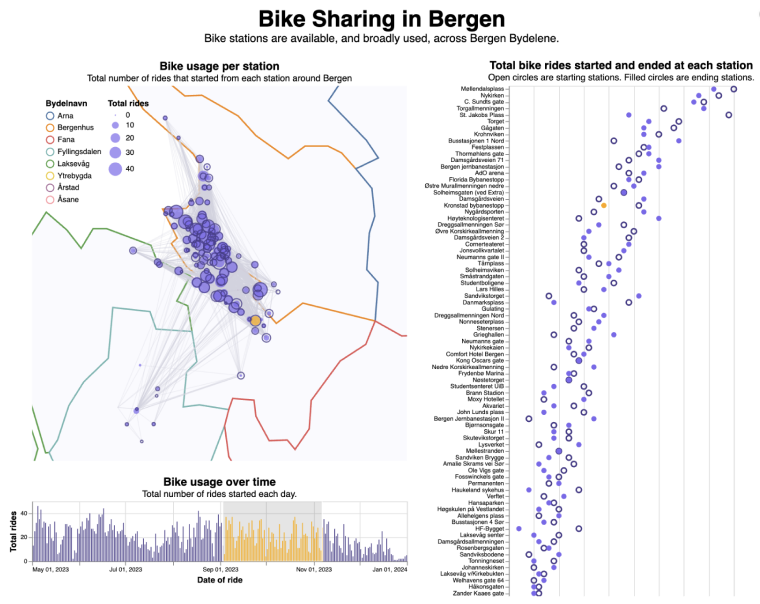

---
# Kilder

**Note:** Denne modulen er delvis basert på [Altair User Guide to Geoshape](https://altair-viz.github.io/user_guide/marks/geoshape.html) og [Top-level Chart Configurations](https://altair-viz.github.io/user_guide/configuration.html). 

**Ressurser:** [UW Data Visualization Curriculum - Cartographic visualization](https://idl.uw.edu/visualization-curriculum/altair_cartographic.html).

**Datasett som brukes i denne modulen:** 
- Titanic Dataset with Coordinates: https://www.kaggle.com/datasets/amykzhang/titanic-dataset-with-coordinates
- Bergen Bydeler Map: https://www.kaggle.com/datasets/amykzhang/bydeler-bergen-map
- Bergen Weather Data 2023: https://www.kaggle.com/datasets/amykzhang/bergen-weather-data-2023

---
By Ke Er Zhang and Laura Garrison. © Copyright 2024.